# Data preparation for UHI modeling

## Set-up

In [1]:
# import special packages
import os
import math
import folium
import rasterio
import rioxarray as rxr
import numpy as np
import pandas as pd
import geopandas as gpd
import shapely.geometry as sg
import matplotlib.pyplot as plt
from matplotlib import pyplot
from math import radians, cos, sin, asin, sqrt
from folium.plugins import MeasureControl
from IPython.display import display
from shapely.geometry import Polygon
from shapely.geometry import box
from pyproj import CRS, Transformer

In [ ]:
# import warnings
# warnings.filterwarnings("ignore")

In [ ]:
home_directory = os.path.expanduser( '~' )
os.chdir(home_directory + '/DS_Project/modules')

import pickle
import yaml
config_path = 'config.yml'
with open(config_path, 'r') as f:
    config = yaml.load(f, Loader=yaml.FullLoader)

In [ ]:
import data_retrieval.Ecostress.utils
import models.UHI_modeling.disaggregate

## Initialize grid

In [5]:
def divide_polygon_into_grid(polygon, grid_size_meters):
    # Calculate the grid size in degrees based on the polygon's CRS
    lon_distance = polygon.bounds[2] - polygon.bounds[0]
    lat_distance = polygon.bounds[3] - polygon.bounds[1]
    lon_grid_size = grid_size_meters / (111320 * math.cos(math.radians(polygon.bounds[1])))
    lat_grid_size = grid_size_meters / 111320

    # Generate grid polygons within the polygon extent
    grid_polygons = []
    for lon in np.arange(polygon.bounds[0], polygon.bounds[2], lon_grid_size):
        for lat in np.arange(polygon.bounds[1], polygon.bounds[3], lat_grid_size):
            square = Polygon([
                (lon, lat), (lon + lon_grid_size, lat),
                (lon + lon_grid_size, lat + lat_grid_size), (lon, lat + lat_grid_size)
            ])
            if polygon.intersects(square):
                intersection = polygon.intersection(square)
                if intersection.area > 0:
                    if intersection.geom_type == 'Polygon':
                        if intersection.equals(square):
                            grid_polygons.append(intersection)
                    elif intersection.geom_type == 'MultiPolygon':
                        for part in intersection:
                            if part.equals(square):
                                grid_polygons.append(part)

    grid_gdf = gpd.GeoDataFrame(geometry=grid_polygons)
    grid_gdf.crs =  'EPSG:4326'# Assign the CRS to the GeoDataFrame
    return grid_gdf

In [6]:
coordinates = config['bboxes']['munich']
coordinates = [11.446343, 48.114298, 11.649817, 48.183462]
coordinates = [11.547582, 48.114226, 11.627263, 48.155554]
print(coordinates)

[11.547582, 48.114226, 11.627263, 48.155554]


In [7]:
vertices = [
    (coordinates[0], coordinates[3]),
    (coordinates[2], coordinates[3]),
    (coordinates[2], coordinates[1]),
    (coordinates[0], coordinates[1])
]
polygon = Polygon(vertices)

# Assign the suitable CRS to the GeoDataFrame
polygon_gdf = gpd.GeoDataFrame(geometry=[polygon])
polygon_gdf.crs = 'EPSG:4326'

In [8]:
# check for 100 meter grid size
grid_size_meters = 100
grid_100 = divide_polygon_into_grid(polygon_gdf.geometry[0], grid_size_meters)

In [9]:
gdf = grid_100['geometry'].to_crs({'proj':'cea'})
gdf.area.describe()

count     2714.000000
mean     10003.110333
std          2.296004
min       9999.219368
25%      10001.121886
50%      10003.110556
75%      10005.098890
max      10007.000461
dtype: float64

In [10]:
grid_size_meters = 1000
grid_1000 = divide_polygon_into_grid(polygon_gdf.geometry[0], grid_size_meters)
grid_1000['id'] = 1000000 + np.arange(1,len(grid_1000)+1)
grid_1000.head()

,geometry,id
0,"POLYGON ((11.54758 48.11423, 11.54758 48.12321...",1000001
1,"POLYGON ((11.54758 48.13219, 11.56104 48.13219...",1000002
2,"POLYGON ((11.54758 48.14118, 11.56104 48.14118...",1000003
3,"POLYGON ((11.54758 48.15016, 11.56104 48.15016...",1000004
4,"POLYGON ((11.56104 48.11423, 11.56104 48.12321...",1000005


In [11]:
center = [polygon.centroid.y, polygon.centroid.x]
grid_map = folium.Map(location=center, zoom_start=12)

# folium.GeoJson(polygon_gdf.geometry.__geo_interface__,
#                style_function=lambda x: {'fillColor': 'transparent', 'color': 'red'}
#               ).add_to(grid_map)

# Add the grid polygons to the map
for index, row in grid_1000.iterrows():
    folium.GeoJson(row.geometry.__geo_interface__, 
                   style_function=lambda x: {'fillColor': 'grey', 'fillOpacity': 0.2, 'color': 'black', 'colorOpacity': 0.7}
                  ).add_to(grid_map)

# Display the map
grid_map

In [12]:
grid_map.save(config['data']['data'] + '/uhi_model/grid.html')

## Extract features

In [13]:
with open(config['data']['data'] + '/uhi_model/input/input.pkl', 'rb') as file:
    inp = pickle.load(file)

In [14]:
inp.to_crs(crs='EPSG:4326', inplace=True)
print(inp.crs == grid_1000.crs)

True


In [15]:
bbox = box(*coordinates)
inp = inp[inp.geometry.intersects(bbox)]

In [16]:
surface_labels = inp.label.unique().tolist()

In [17]:
def calculate_surface_coverage(grid, inp, surface_labels):
    # Create an empty list to store the results
    results = []

    # Iterate over each square in the grid dataframe
    for idx, square in grid.iterrows():
        # Get the geometry of the square
        square_geom = square.geometry

        # Create an empty dictionary to store surface areas
        surface_areas = {label: 0 for label in surface_labels}

        # Iterate over each surface polygon in the inp dataframe
        for inp_idx, surface_polygon in inp.iterrows():
            # Get the intersection between the square and surface polygon
            intersection = square_geom.intersection(surface_polygon.geometry)

            # Check if the intersection is valid and non-empty
            if not intersection.is_empty and intersection.area > 0:
                # Calculate the area of the intersection
                intersection_area = intersection.area

                # Get the surface label for the current polygon
                surface_label = surface_polygon['label']

                # Update the surface area dictionary
                surface_areas[surface_label] += intersection_area

        # Calculate the total area of the square
        square_area = square_geom.area

        # Calculate the fraction of each surface type in the square
        surface_fractions = {surface_label: area / square_area for surface_label, area in surface_areas.items()}

        # Append the results for the current square to the list
        results.append({'id': square['id'], 'surface_fractions': surface_fractions})

    # Convert the list of results to a pandas DataFrame
    result_df = pd.DataFrame(results)

    return result_df


In [18]:
result = calculate_surface_coverage(grid_1000, inp, surface_labels)
result.head()

/pfs/work7/workspace/scratch/tu_zxmav84-ds_project/conda/envs/DS_Project/lib/python3.10/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


,id,surface_fractions
0,1000001,"{'impervious': 0.36434020962954494, 'building'..."
1,1000002,"{'impervious': 0.24454396570585896, 'building'..."
2,1000003,"{'impervious': 0.24023376552038725, 'building'..."
3,1000004,"{'impervious': 0.32827963171688407, 'building'..."
4,1000005,"{'impervious': 0.24557772411731255, 'building'..."


In [19]:
def convert_to_surface_dataframe(result):
    # Create an empty dictionary to store the surface fractions
    surface_fractions_dict = {}

    # Iterate over each row in the result dataframe
    for idx, row in result.iterrows():
        # Get the surface fractions dictionary for the current row
        surface_fractions = row['surface_fractions']

        # Iterate over each surface type and fraction in the dictionary
        for surface_type, fraction in surface_fractions.items():
            # Create a column name using the surface type
            column_name = surface_type

            # Check if the column name already exists in the dictionary
            if column_name in surface_fractions_dict:
                # Append the fraction to the existing column
                surface_fractions_dict[column_name].append(fraction)
            else:
                # Create a new list for the column and add the fraction
                surface_fractions_dict[column_name] = [fraction]

    # Convert the surface fractions dictionary to a Pandas dataframe
    surface_df = pd.DataFrame(surface_fractions_dict)

    # Add the square ID column from the result dataframe
    surface_df['id'] = result['id']

    # Reorder the columns with the square ID as the first column
    surface_df = surface_df[['id'] + list(surface_df.columns[:-1])]

    return surface_df

In [20]:
surface_df = convert_to_surface_dataframe(result)

In [21]:
def calculate_row_sum(dataframe):
    # Select numeric columns excluding the 'id' column
    numeric_columns = dataframe.select_dtypes(include='number').columns.drop('id')

    # Calculate the sum of values for each row
    dataframe['sum'] = dataframe[numeric_columns].sum(axis=1)

    return dataframe

In [22]:
surface_df = calculate_row_sum(surface_df)
surface_df.head()

,id,impervious,building,low vegetation,water,trees,road,ignore,sum
0,1000001,0.364340,0.296941,0.034970,0.051180,0.084780,0.167789,0.0,1.0
1,1000002,0.244544,0.358791,0.131043,0.000000,0.058639,0.206982,0.0,1.0
2,1000003,0.240234,0.459194,0.036678,0.000000,0.067624,0.196271,0.0,1.0
3,1000004,0.328280,0.398221,0.003322,0.000000,0.049877,0.220301,0.0,1.0
4,1000005,0.245578,0.195481,0.037093,0.064962,0.291498,0.165388,0.0,1.0


In [23]:
grid_polygon_index = 5
subset = grid_1000.iloc[grid_polygon_index,:].geometry
example = inp[inp.geometry.intersects(subset)]

In [25]:
styles = {
    'ignore':{"fillColor": "#000000", 'color':'#000000', 'weight':0, 'fillOpacity':0.5}, 
    'impervious':{"fillColor": "#ffffff", 'color':'#ffffff', 'weight':0, 'fillOpacity':0.5}, 
    'building':{"fillColor": "#ff00ff", 'color':'#ff00ff', 'weight':0, 'fillOpacity':0.5}, 
    'low vegetation':{"fillColor": "#00ff00", '#00ff00':'pink', 'weight':0, 'fillOpacity':0.5}, 
    'water':{"fillColor": "#0000ff", 'color':'#0000ff', 'weight':0, 'fillOpacity':0.5}, 
    'trees':{"fillColor": "#008200", 'color':'#008200', 'weight':0, 'fillOpacity':0.5}, 
    'road':{"fillColor": "#ff0000", 'color':'#ff0000', 'weight':0, 'fillOpacity':0.5}, 
    'train':{"fillColor": "#505050", 'color':'#505050', 'weight':0, 'fillOpacity':0.5}, 
}
feature_map = folium.Map(location = [example.iloc[0,:].geometry.centroid.y, example.iloc[0,:].geometry.centroid.x], zoom_start = 14)
# Add ESRI Satellite Layer
tile = folium.TileLayer(
        tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri', name = 'Esri Satellite', overlay = False, control = True).add_to(feature_map)
# Add Semantic Segmentation Layer
folium.GeoJson(subset.__geo_interface__, 
                style_function=lambda x: {'fillColor': 'grey', 'fillOpacity': 0.2, 'color': 'black', 'colorOpacity': 0.7}
                ).add_to(feature_map)
for label in surface_labels:
    folium.GeoJson(example[(example.label == label)].geometry, style_function=lambda x, label=label: styles[label], name=label).add_to(feature_map)
folium.LayerControl().add_to(feature_map)
feature_map

In [40]:
feature_map.save(config['data']['data'] + '/uhi_model/feature.html')

In [43]:
subset_id = grid_1000.iloc[grid_polygon_index,grid_1000.shape[1]-1]
surface_df[surface_df.id == subset_id]

,id,impervious,building,low vegetation,water,trees,road,ignore,sum
5,1000006,0.211831,0.319852,0.00679,0.0384,0.200559,0.222568,0.0,1.0


## Extract target

In [27]:
path = config['data']['data'] + '/ECOSTRESS/mean_afterNoon_HT.tif'
src = rasterio.open(path)
dataarray = rxr.open_rasterio(path)

In [28]:
out_image, transformed = rasterio.mask.mask(src, [subset], all_touched=True, crop=True, filled=False)
clipped_dataarray = dataarray.rio.clip([subset],all_touched=True)
print(out_image.shape)
print(clipped_dataarray.shape)

(1, 15, 22)
(1, 15, 22)



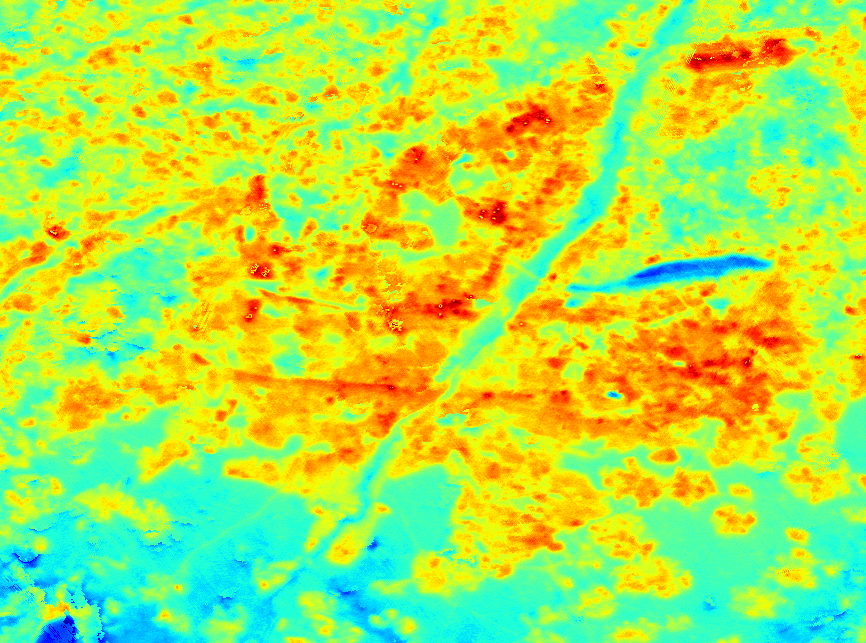

In [29]:
lst_map = tiffs_to_foliumMap(path)
folium.GeoJson(subset.__geo_interface__, 
                style_function=lambda x: {'fillColor': 'grey', 'fillOpacity': 0.2, 'color': 'black', 'colorOpacity': 0.7}
                ).add_to(lst_map)
lst_map

In [30]:
lst_map.save(config['data']['data'] + '/uhi_model/lst.html')

In [31]:
lst_mean = clipped_dataarray.mean()
print(lst_mean.values)

37.41575757575758


In [32]:
lst_mean = out_image.mean()
print(lst_mean)

37.41575757575758


In [ ]:
# save grids to workspace (geopandas dataframe)
with open(config['data'] + '/uhi_model/grid_1000_a.pkl', 'wb') as file:
    pickle.dump(grid_1000, file)
with open(config['data'] + '/uhi_model/grid_100_a.pkl', 'wb') as file:
    pickle.dump(grid_100, file)

In [33]:
# save grid features to workspace (pandas dataframe)
with open(config['data'] + '/uhi_model/uhi_data.pkl', 'wb') as file:
    pickle.dump(surface_df[["id","impervious","building","low vegetation","water","trees","road"]], file)

In [34]:
# def divide_polygon_into_grid(polygon, grid_size_meters):
#     # Calculate the grid size in degrees based on the polygon's CRS
#     lon_distance = polygon.bounds[2] - polygon.bounds[0]
#     lat_distance = polygon.bounds[3] - polygon.bounds[1]
#     lon_grid_size = grid_size_meters / (111320 * np.cos(np.radians(polygon.bounds[1])))
#     lat_grid_size = grid_size_meters / 111320

#     # Calculate the number of grid cells in each dimension
#     num_lon_cells = int(lon_distance / lon_grid_size)
#     num_lat_cells = int(lat_distance / lat_grid_size)

#     # Generate grid polygons within the polygon extent
#     grid_polygons = []
#     lon_dis = 0.0
#     lat_dis = 0.0
#     lonner = polygon.bounds[0]
#     for i in range(num_lon_cells):
#         lon_grid_size = grid_size_meters / (111320 * np.cos(np.radians(lonner)))
#         #print(lon_grid_size)
#         #print(l)
#         latter = polygon.bounds[1]
#         for j in range(num_lat_cells):
#             lon = lonner
#             lat = latter

#             square = Polygon([
#                 (lon, lat), (lon + lon_grid_size, lat),
#                 (lon + lon_grid_size, lat + lat_grid_size), (lon, lat + lat_grid_size)
#             ])

#             if polygon.intersects(square):
#                 intersection = polygon.intersection(square)
#                 if intersection.area > 0:
#                     if intersection.geom_type == 'Polygon':
#                         if intersection.equals(square):
#                             grid_polygons.append(intersection)
#                     elif intersection.geom_type == 'MultiPolygon':
#                         for part in intersection:
#                             if part.equals(square):
#                                 grid_polygons.append(part)
#             latter += lon_grid_size
#         lonner += lon_grid_size

#     grid_gdf = gpd.GeoDataFrame(geometry=grid_polygons)
#     grid_gdf.crs =  'EPSG:4326'# Assign the CRS to the GeoDataFrame
#     return grid_gdf

In [35]:
# def adjust_coordinates(coordinates, mult=100):
#     lon1, lat1, lon2, lat2 = coordinates

#     # Calculate the distance between the longitude points
#     lon_distance = haversine(lon1, lat1, lon2, lat1)

#     # Calculate the distance between the latitude points
#     lat_distance = haversine(lon1, lat1, lon1, lat2)

#     # Calculate the adjusted longitude values
#     lon_adjustment = math.ceil(lon_distance / mult) * mult - lon_distance
#     new_lon1 = lon1 + lon_adjustment / (111320 * math.cos(math.radians(lat1)))  # Convert meters to degrees
#     new_lon2 = lon2 - lon_adjustment / (111320 * math.cos(math.radians(lat2)))  # Convert meters to degrees

#     # Calculate the adjusted latitude values# def divide_into_grid(coordinates, mult):
#     lon1, lat1, lon2, lat2 = coordinates

#     # Calculate the number of rows and columns in the grid
#     lat_distance = haversine(lon1, lat1, lon2, lat2)
#     lon_distance = haversine(lon1, lat1, lon2, lat2)
#     num_rows = int(lat_distance / mult)
#     num_cols = int(lon_distance / mult)

#     # Calculate the size of each grid cell in degrees
#     lat_cell_size = (lat2 - lat1) / num_rows
#     lon_cell_size = (lon2 - lon1) / num_cols

#     # Initialize the grid to store the individual areas
#     grid = []

#     # Iterate over the rows and columns to create the individual areas
#     for row in range(num_rows):
#         for col in range(num_cols):
#             # Calculate the coordinates of the current grid cell
#             cell_lat1 = lat1 + row * lat_cell_size
#             cell_lon1 = lon1 + col * lon_cell_size
#             cell_lat2 = cell_lat1 + lat_cell_size
#             cell_lon2 = cell_lon1 + lon_cell_size

#             # Add the coordinates of the current grid cell to the grid
#             grid.append([cell_lon1, cell_lat1, cell_lon2, cell_lat2])

#     return grid
#     lat_adjustment = math.ceil(lat_distance / mult) * mult - lat_distance
#     new_lat1 = lat1 + lat_adjustment / 111320  # Convert meters to degrees
#     new_lat2 = lat2 - lat# def convert_lon_lat(point):
#     return [point[1], point[0]]

In [36]:
# def convert_lon_lat_bbox(bbox):
#     converted_bbox = [convert_lon_lat(bbox[:2])]
#     converted_bbox.append(convert_lon_lat(bbox[2:]))
#     return [coord for point in converted_bbox for coord in point]_adjustment / 111320  # Convert meters to degrees

#     return [new_lon1, new_lat1, new_lon2, new_lat2]

In [37]:
# def calculate_surface_coverage(grid, inp):
#     # Create a new GeoDataFrame to store the results
#     result = gpd.GeoDataFrame()

#     # Iterate over each square in the grid dataframe
#     for idx, square in grid.iterrows():
#         # Get the geometry of the square
#         square_geom = square.geometry

#         # Create an empty dictionary to store surface areas
#         surface_areas = {}

#         # Iterate over each surface polygon in the inp dataframe
#         for inp_idx, surface_polygon in inp.iterrows():
#             # Get the intersection between the square and surface polygon
#             intersection = square_geom.intersection(surface_polygon.geometry)

#             # Calculate the area of the intersection
#             intersection_area = intersection.area

#             # Get the surface label for the current polygon
#             surface_label = surface_polygon['label']

#             # Update the surface area dictionary
#             if surface_label in surface_areas:
#                 surface_areas[surface_label] += intersection_area
#             else:
#                 surface_areas[surface_label] = intersection_area

#         # Calculate the total area of the square
#         square_area = square_geom.area

#         # Calculate the fraction of each surface type in the square
#         surface_fractions = {surface_label: area / square_area for surface_label, area in surface_areas.items()}

#         # Add the surface fractions to the result dataframe
#         result = result.append({'id': square['id'], 'surface_fractions': surface_fractions}, ignore_index=True)

#     return result

In [38]:
# def aggregate_temperature_data(data, grid):
#     # Create an empty array to store the aggregated temperature values
#     aggregated_data = np.zeros(len(grid))

#     # Iterate over each grid cell
#     for i, cell in enumerate(grid):
#         # Extract the coordinates of the grid cell
#         lon1, lat1, lon2, lat2 = cell

#         # Create a Polygon object for the grid cell
#         cell_polygon = Polygon([(lon1, lat1), (lon2, lat1), (lon2, lat2), (lon1, lat2)])

#         # Calculate the area of the grid cell
#         cell_area = cell_polygon.area

#         # Get the corresponding land surface temperature data within the grid cell
#         cell_data = data.cx[lon1:lon2, lat1:lat2]

#         # Calculate the weighted mean temperature for the grid cell
#         weighted_mean = np.average(cell_data, weights=cell_area)

#         # Store the aggregated temperature value for the grid cell
#         aggregated_data[i] = weighted_mean

#     return aggregated_data